In [165]:
!jupyter nbconvert  Project3_data_2.ipynb --to html

[NbConvertApp] Converting notebook Project3_data_2.ipynb to html
[NbConvertApp] Writing 6726996 bytes to Project3_data_2.html


# Poisson Regression for Collision Data (2016 Ottawa)

## Razieh Pourhasan

# Table of contents 

- <a href='#intro'>1. Introduction</a>  

- <a href='#pod'>2. preliminary process of Data</a>
     - <a href='#ll'>2.1 Load libraries</a>
     - <a href='#rrtd'>2.2 Read the Data</a>
     - <a href='#oot'>2.3 Overview of tables</a>
     - <a href='#dnc'>2.4 Dividing the data into numerical and categorical</a>
     - <a href='#socv'>2.5 Statistics overview of categorical features</a>


- <a href='#dp'>3. Data preparation</a>
     - <a href='#cfmd'> 3.1 Check for missing data</a>


- <a href='#q1'>4. Question 1 </a>
     - <a href='#sod'>4.1 The source of the dataset </a>
     - <a href='#dd'>4.2 Data dictionary to explain variables</a>

- <a href='#q2'>5. Question 2 </a>
     - <a href='#loq'>5.1 List of questions about the datasets. </a>


- <a href='#q3'>6. Question 3 and 4 </a>
     - <a href='#udcov'>6.1 Univariate and Bivariate Distribution of Variables </a>
     - <a href='#pcorr'>6.2 Pairwise Correlation <a>
     

- <a href='#q5'>7. Question 5 </a>
     - <a href='#dwtd'>7.1 Do you trust the dataset, or not? Support your answer.  </a>
     - <a href='#tie'>7.2 Flag potential invalid entries, anomalous observations, or outliers. How should these
    entries be treated? </a>
     


- <a href='#q6'>8. Question 6 </a>
    - <a href='#sosvt'>8.1 Does any of your analysis suggest that some of the variables should be transformed? </a>
    

 

 




# <a id='pod'>2. Preliminary Process of Data</a>  

### <a id='ll'>2.1 Load libraries</a>
We import pandas to work with our data, Matplotlib to plot charts, and Seaborn to make our charts prettier.

In [85]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as ss
import seaborn as sns
import plotnine
import plotly.offline as py
import plotly.graph_objs as go
color = sns.color_palette()
sns.set(style="darkgrid")
import scipy.stats as ss
import matplotlib.pyplot as plt
from collections import Counter
from dython._private import convert, remove_incomplete_samples, replace_nan_with_value
from dython.nominal import associations

### <a id='rrtd'>2.2 Read the Data</a>

Let's load the "2016collisionsfinal.csv" which has been provided in datasets for the course.


In [34]:
rawdf = pd.read_csv('2016collisionsfinal.csv')
rawdf.head()

,Record,Location,X,Y,Date,Time,Environment,Road_Surface,Traffic_Control,Collision_Location,Light,Collision_Classification,Impact_type
0,1,105 S OF COMMISSIONER ST @ ALBERT ST,366666.2747,5030879.415,8/4/16,17:03,01 - Clear,01 - Dry,01 - Traffic signal,02 - Intersection related,01 - Daylight,03 - P.D. only,04 - Sideswipe
1,2,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365431.439,5021830.23,3/30/16,15:44,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,02 - Non-fatal injury,05 - Turning movement
2,3,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365432.2342,5021829.655,9/2/16,16:02,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,03 - P.D. only,05 - Turning movement
3,4,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365430.7265,5021830.451,3/12/16,17:30,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,03 - P.D. only,05 - Turning movement
4,5,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365430.6658,5021830.963,8/23/16,15:52,01 - Clear,01 - Dry,01 - Traffic signal,02 - Intersection related,01 - Daylight,03 - P.D. only,03 - Rear end


The first column is just the row index, and count for the record of collisions. We drop it, keep in mind count of columns represents the counts of collisions:

In [35]:
rawdf = rawdf.drop(['Record'], axis=1 )
rawdf.head()

,Location,X,Y,Date,Time,Environment,Road_Surface,Traffic_Control,Collision_Location,Light,Collision_Classification,Impact_type
0,105 S OF COMMISSIONER ST @ ALBERT ST,366666.2747,5030879.415,8/4/16,17:03,01 - Clear,01 - Dry,01 - Traffic signal,02 - Intersection related,01 - Daylight,03 - P.D. only,04 - Sideswipe
1,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365431.439,5021830.23,3/30/16,15:44,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,02 - Non-fatal injury,05 - Turning movement
2,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365432.2342,5021829.655,9/2/16,16:02,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,03 - P.D. only,05 - Turning movement
3,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365430.7265,5021830.451,3/12/16,17:30,01 - Clear,01 - Dry,01 - Traffic signal,03 - At intersection,01 - Daylight,03 - P.D. only,05 - Turning movement
4,210 W OF MERIVALE RD @ WEST HUNT CLUB RD,365430.6658,5021830.963,8/23/16,15:52,01 - Clear,01 - Dry,01 - Traffic signal,02 - Intersection related,01 - Daylight,03 - P.D. only,03 - Rear end


### <a id='oot'>2.3 Overview of tables</a>

#### <a href='norf'>2.3.1 Number of rows and features</a>

In [36]:
print('The dataset 2016collisionsfinal has {} rows and {} features'.format(rawdf.shape[0],rawdf.shape[1]))

The dataset 2016collisionsfinal has 14023 rows and 12 features


#### <a id='ndt'>2.3.2 Features' names and data types</a>





In [37]:
print('The list names of the features are : {}  '.format(rawdf.columns.values))


The list names of the features are : ['Location' 'X' 'Y' 'Date' 'Time' 'Environment' 'Road_Surface'
 'Traffic_Control' 'Collision_Location' 'Light' 'Collision_Classification'
 'Impact_type']  


In [38]:
print('Information about the type features:')
rawdf.info() 

Information about the type features:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14023 entries, 0 to 14022
Data columns (total 12 columns):
Location                    14023 non-null object
X                           14023 non-null object
Y                           14023 non-null object
Date                        14023 non-null object
Time                        14023 non-null object
Environment                 14023 non-null object
Road_Surface                14023 non-null object
Traffic_Control             14020 non-null object
Collision_Location          14017 non-null object
Light                       14021 non-null object
Collision_Classification    14023 non-null object
Impact_type                 14023 non-null object
dtypes: object(12)
memory usage: 1.3+ MB


### <a id='dnc'>2.4  Dividing the data into numerical and categorical</a>

The data has 2 numerical features: 'X' and 'Y'. However, they are originally stored as string. 

The data has 2 date/time features: 'Date' and 'Time'. However, they are originally stored as string.

The data has 8 categorical features: 'Location', 'Environment', 'Road_Surface', 'Traffic_Control', 'Collision_Location', 'Light', 'Collision_Classification','Impact_type'

### <a id='socv'>2.5 Statistics overview of categorical features</a>

In [39]:
rawdf.describe()

,Location,X,Y,Date,Time,Environment,Road_Surface,Traffic_Control,Collision_Location,Light,Collision_Classification,Impact_type
count,14023,14023,14023,14023,14023,14023,14023,14020,14017,14021,14023,14023
unique,5739,13293,13336,366,1338,9,10,6,9,10,3,8
top,ST. JOSEPH BLVD @ JEANNE D'ARC BLVD,383640.9751,5036900.456,2/17/16,0:00,01 - Clear,01 - Dry,10 - No control,01 - Non intersection,01 - Daylight,03 - P.D. only,03 - Rear end
freq,59,14,14,152,250,11008,9140,6894,5534,9572,11252,4653


# <a id='dp'>3. Data preparation</a>

### <a id='cfmd'> 3.1 Check for missing data</a>

Quick check to see if there is any missing values at all:

In [40]:
print(rawdf.isnull().values.any())

True


The answer is **Yes**, then let's see which columns have missing values:

In [41]:
# checking missing data 
total = rawdf.isnull().sum().sort_values(ascending = False)
percent = 100*(rawdf.isnull().sum()/rawdf.isnull().count()).sort_values(ascending = False)
missing_data  = pd.concat([total, percent, percent.cumsum()], axis=1, keys=['Total missing ', 'Percent', 'Cumulative Percent'])
missing_data.head(10)

,Total missing,Percent,Cumulative Percent
Collision_Location,6,0.042787,0.042787
Traffic_Control,3,0.021393,0.064180
Light,2,0.014262,0.078443
Impact_type,0,0.000000,0.078443
Collision_Classification,0,0.000000,0.078443
Road_Surface,0,0.000000,0.078443
Environment,0,0.000000,0.078443
Time,0,0.000000,0.078443
Date,0,0.000000,0.078443
Y,0,0.000000,0.078443


Since the missing values are a very small percentage of data, we can safely drop rows with missing values, we also rename data frame to `df`:

In [49]:
df = rawdf.dropna(axis=0 , how='any')

We do a quick check to make sure all rows with missing values have been dropped:

In [43]:
print(df.isnull().values.any())

False


In [44]:
# comparing sizes of data frames 
print("Old data frame length:", len(rawdf), "\nNew data frame length:",  
       len(df), "\nNumber of rows with at least 1 NA value: ", 
       (len(rawdf)-len(df))) 

Old data frame length: 14023 
New data frame length: 14012 
Number of rows with at least 1 NA value:  11


# <a id='q1'>4. Question 1 </a>

### <a id='sod'>4.1 The source of the dataset </a>
The online source for this dataset is [2016 Tabular Transportation Collision Data](https://open.ottawa.ca/datasets/2016-tabular-transportation-collision-data/data) on the [Open Ottawa](https://open.ottawa.ca/) website.

###  <a id='dd'>4.2 Data dictionary to explain variables</a>





We’ve loaded our data set into `rawdf` which basically looks like a table. Below is the Data Dictionary for the dataset:

In [13]:
data_dictionary = pd.DataFrame(index = df.columns, columns=['type', 'description'])
for name in df.columns:
    data_dictionary.loc[name,'type'] = 'string'
    
data_dictionary.loc[df.columns[1],'type'] = 'float'
data_dictionary.loc[df.columns[2],'type'] = 'float'
data_dictionary.loc[df.columns[3],'type'] = 'date'
data_dictionary.loc[df.columns[4],'type'] = 'time'
    
data_dictionary.loc[df.columns[0],'description'] = 'Location description (RD1 @ RD2 or RD from RD1 to RD2)'
data_dictionary.loc[df.columns[1],'description'] = 'coordinate format is projected in MTM Zone 9, NAD83 (CSRS)'
data_dictionary.loc[df.columns[2],'description'] = 'coordinate format is projected in MTM Zone 9, NAD83 (CSRS)'
data_dictionary.loc[df.columns[3],'description'] = 'Date (m/d/yy)'
data_dictionary.loc[df.columns[4],'description'] = 'Time (hh:mm with hh from 00 to 24 and mm from 00 to 59)'
data_dictionary.loc[df.columns[5],'description'] = 'Environment (Clear, rain, snow, ...)'
data_dictionary.loc[df.columns[6],'description'] = 'Road surface condition (Ice, wet, dry snow, ...)'
data_dictionary.loc[df.columns[7],'description'] = 'Traffic control (stop, traffic signal, no control, ...) ' 
data_dictionary.loc[df.columns[8],'description'] = 'Collision location (Intersection, non-intersection, at/near private driveway)'
data_dictionary.loc[df.columns[9],'description'] = 'Light (daylight, dawn, dusk, ...)'
data_dictionary.loc[df.columns[10],'description'] = 'Classification of collision (non-fatal, fatal, property damage only)'
data_dictionary.loc[df.columns[11],'description'] = 'Initial impact type (Angle, turning movement, rear-end…) '

pd.set_option('display.max_colwidth', -1)
data_dictionary

,type,description
Location,string,Location description (RD1 @ RD2 or RD from RD1 to RD2)
X,float,"coordinate format is projected in MTM Zone 9, NAD83 (CSRS)"
Y,float,"coordinate format is projected in MTM Zone 9, NAD83 (CSRS)"
Date,date,Date (m/d/yy)
Time,time,Time (hh:mm with hh from 00 to 24 and mm from 00 to 59)
Environment,string,"Environment (Clear, rain, snow, ...)"
Road_Surface,string,"Road surface condition (Ice, wet, dry snow, ...)"
Traffic_Control,string,"Traffic control (stop, traffic signal, no control, ...)"
Collision_Location,string,"Collision location (Intersection, non-intersection, at/near private driveway)"
Light,string,"Light (daylight, dawn, dusk, ...)"


# <a id='q2'>5. Question 2 </a>

###  <a id='loq'>5.1 List of questions about the datasets. </a>


* The main goal : Understanding data by exploring and trying to spot unlikely and irregular patterns.

* What are the features?
* What type of features do we have: numerical, categorical, or both?
* Is there missing data or null values?
* Is there a correlation between the features?
* Are there duplicated features? 
* Do we need all the data to perform proper analysis, or do we need a subset to ensure faster performance? 
* Is the data complete? Accurate? Up to date?
* In its current state, can we use the data to answer our questions?
* If there are inconsistencies or redundant values, what do we need to do to clean the data? Is it a matter of   manually changing a few values or will a more systematic approach be necessary?
* Do we need to further consolidate the data? In other words, could we pick a subset of data for the types of analysis we want to perform?


# <a id='q3'>6. Question 3 </a>

### <a id='udcov'>6.1 Univariate and Bivariate Distribution of Features </a>

#### <a id='hocv'> 6.1.1 Distribution of Location</a>

Text(0.5, 1.0, 'Location')

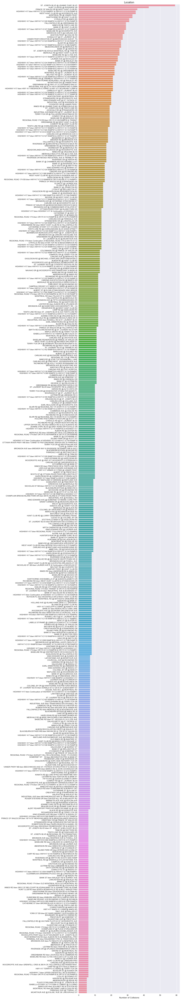

In [14]:
plt.figure(figsize=(10,100))
count = df['Location'].value_counts().head(500)
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Location', fontsize=15)

About 60 collision has been recorded at the intersection of St. Joseph Blvd and Jean d'Arc Blvd and more than 40 at the intersection of Hunt Club Rd and Riverside Dr. We can use X and Y coordinates to get a map of collisions. To do so, we need to first convert X and Y to a float as they are originally recorded in a string format. We do that with the following code:

In [51]:
df['X'] = df['X'].str.replace('\,', '').astype(float)
df['Y'] = df['Y'].str.replace('\,', '').astype(float)

/Applications/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Applications/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Next, let's have a quick look at the X and Y scatter plot: 

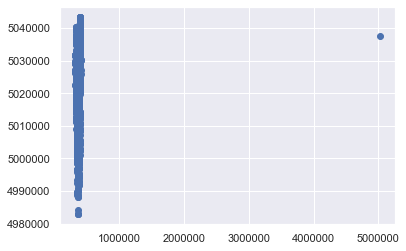

In [52]:
plt.scatter(df.X, df.Y)

It seems that there is an outlier in the X coordinate. Let's find the location of the outlier:

In [53]:
df[df.X > 1000000]

,Location,X,Y,Date,Time,Environment,Road_Surface,Traffic_Control,Collision_Location,Light,Collision_Classification,Impact_type
13480,VIEILLE-CASERNE PRIV btwn TOMPKINS AVE & TOMPK...,5019473.742,5037585.1,12/18/16,9:00,03 - Snow,03 - Loose snow,10 - No control,04 - At/near private drive,01 - Daylight,03 - P.D. only,99 - Other


We remove the X oulier and plot the map of collisions:

In [54]:
dfxy = df.drop(axis = 0, index = df[df.X > 1000000].index)

In [120]:
import plotly.express as px

fig = px.scatter(dfxy, x="X", y="Y", color="Collision_Classification",
                 hover_data=['Location'])

fig.update_layout(autosize=False,
    width=1400,
   height=800,title_text="Hover over the points to see the location of collision")

fig.show()

Most collisions have been recorded in downtown core, Orleans, Barrhaven and Kanata. 

#### <a id='hocv'> 6.1.2 Distribution of Time</a>

Text(0.5, 1.0, 'Time')

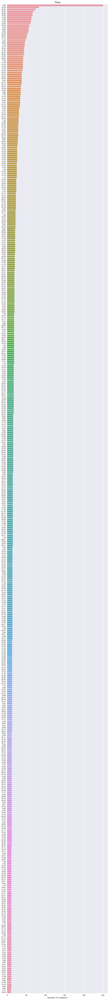

In [51]:
plt.figure(figsize=(10,100))
count = df['Time'].value_counts().head(500)
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Time', fontsize=15)

While the frequency of collisions in 24 hours is between 0-100, there is an exception for midnight which has been recorded as (00:00) with 250 collisions. This is an outlier and probable explanation is when the time is unknown has been also recorded as (00). A closer inspection of other data columns confirm that this is indeed the case for all columns; for example in columns *Road Surface* and *Light*, when the value of a column is unknown the numeric encoder is 00. 

From the statistics overview of the dataset we know that the number of unique recorded times are 1338. To reduce this and have a better view of time we only keep track of the hours in Time columns and leave out the minutes. Then we view the histogram:

Text(0.5, 1.0, 'Time in 24 hours')

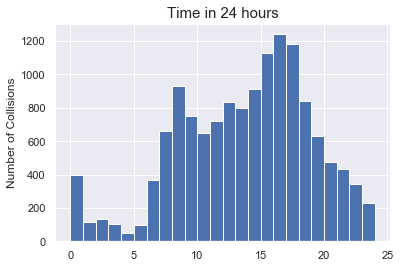

In [76]:
hours =  df['Time'].str.split(':', expand=True).astype(int)[[0]]
hours
hours.hist(bins=24, range=(0, 24), histtype='bar')
plt.ylabel('Number of Collisions', fontsize=12)
plt.title('Time in 24 hours', fontsize=15)

As expected the most frequent recording of collisions is during rush hours (i.e. commuting to and form work) 8-9 AM and 3-6 PM. 

#### <a id='#domp'> 6.1.3 Distribution of Date</a>

Text(0.5, 1.0, 'Date')

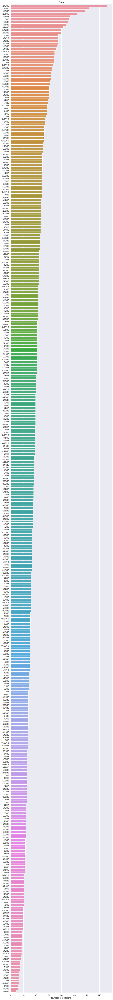

In [128]:
plt.figure(figsize=(10,100))
count = df['Date'].value_counts()
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Date', fontsize=15)

More than 140 collisions recorded in February 17, 2016. Now let's see which month has the most recorded collisions:

Text(0.5, 1.0, 'Date in Months')

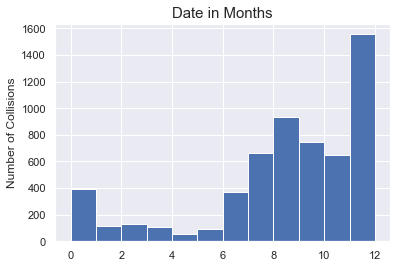

In [132]:
months =  df['Date'].str.split('/', expand=True).astype(int)[[0]]
months
hours.hist(bins=12, range=(0, 12), histtype='bar')
plt.ylabel('Number of Collisions', fontsize=12)
plt.title('Date in Months', fontsize=15)

The frequency of collisions increases in the Fall and Winter. Most collisions recorded in December, could it be that roads are busier closer to the Christmas holiday?   

#### <a id='hocv'> 6.1.4 Distribution of Environment</a>

Text(0.5, 1.0, 'Environment')

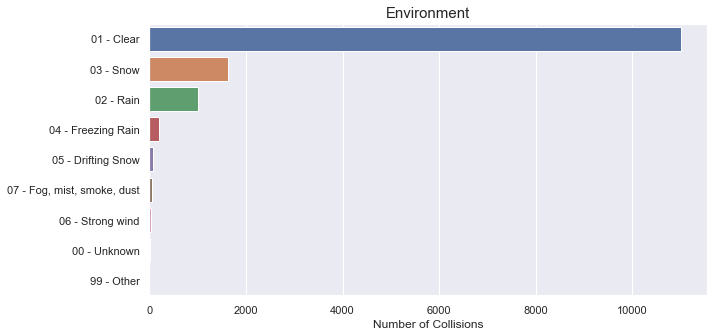

In [88]:
plt.figure(figsize=(10,5))
count = df['Environment'].value_counts()
sns.barplot(count.values, count.index, )
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Environment', fontsize=15)

Collisions often happens in a clear environment! While the frequency of collisions for different types of environment is usually between 0-2000, it is more than 10,000 in clear environment which can be considered as an outlier. 

#### <a id='hocv'> 6.1.5 Distribution of Road Surface</a>

Text(0.5,1,'Road Surface')

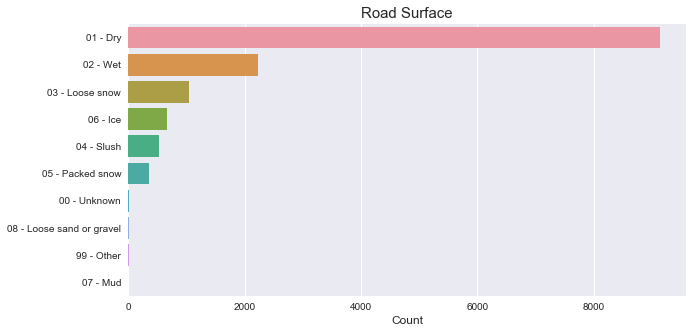

In [37]:
plt.figure(figsize=(10,5))
count = df['Road_Surface'].value_counts()
sns.barplot(count.values, count.index, )
plt.xlabel('Number of Collisions', fontsize=12)
plt.title("Road Surface", fontsize=15)

Collisions often happens when the road surface is dry! While the frequency of collisions for different types of road surface is usually almost between 0-2000, it is more than 8,000 when the road surface is dry which can be considered as an outlier.

#### <a id='hocv'> 6.1.6 Distribution of Traffic Control</a>

Text(0.5,1,'Traffic Control')

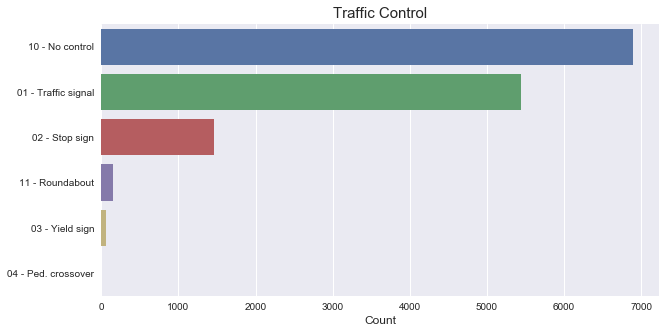

In [38]:
plt.figure(figsize=(10,5))
count = df['Traffic_Control'].value_counts()
sns.barplot(count.values, count.index, )
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Traffic Control', fontsize=15)

Most frequently collisions happen when there is no traffic control which is not surprising. 

#### <a id='hocv'> 6.1.7 Distribution of Collision Location</a>

Text(0.5,1,'Collision Location')

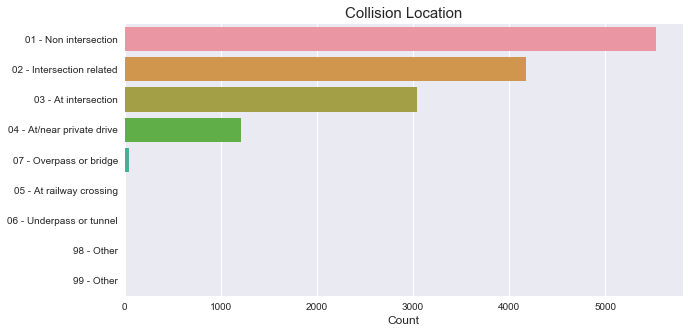

In [39]:
plt.figure(figsize=(10,5))
count = df['Collision_Location'].value_counts()
sns.barplot(count.values, count.index, )
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Collision Location', fontsize=15)

#### <a id='doma'> 6.1.8 Distribution of Light</a>

Collisions often happens when in daylight! While the frequency of collisions for different types of *Light* is usually almost between 0-3000, it is more than 9,000 in daylight which can be considered as an outlier.

Text(0.5,1,'Light')

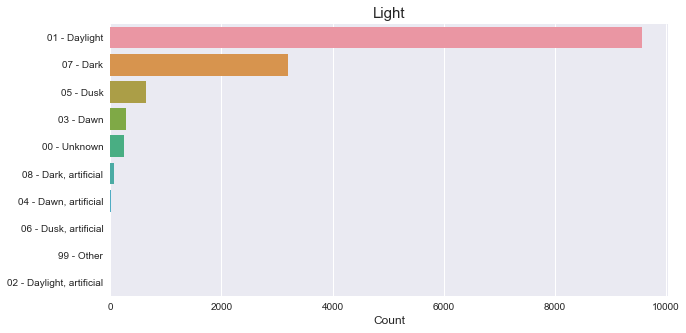

In [43]:
plt.figure(figsize=(10,5))
count = df['Light'].value_counts()
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Light', fontsize=15)

#### <a id='docp'> 6.1.9 Distribution of Collision Calssification</a>

Text(0.5,1,'Collision Classification')

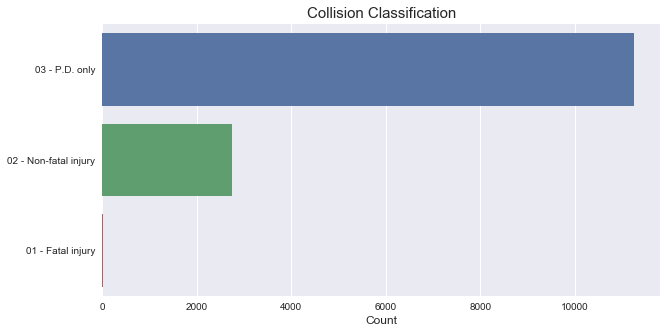

In [45]:
plt.figure(figsize=(10,5))
count = df['Collision_Classification'].value_counts()
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Collision Classification', fontsize=15)

Luckily most recorded collisions recorded as property damage only. There are a few with fatal injuries. We can have a closer look at collisions yielding to fatal injuries:

In [117]:
dfCC = df['Collision_Classification'].str.split('-', expand=True)[[0]].astype(int)
df_fatal = df[dfCC[0] == 1]
df_fatal.shape[0]

23

23 fatal injuries have been recorded. We can find their location on the map (note that we can activate or deactivate the side bars for collision classification by clicking on them):

In [133]:
import plotly.express as px

fig = px.scatter(dfxy, x="X", y="Y", color="Collision_Classification",
                 hover_data=['Location'])

fig.show()

#### <a id='#domp'> 6.1.10 Distribution of Impact type</a>

Text(0.5,1,'Impact type')

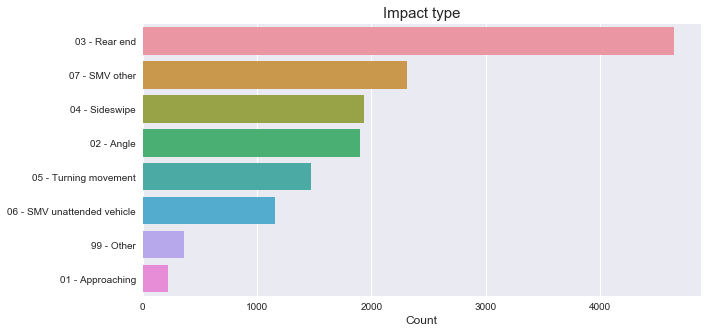

In [46]:
plt.figure(figsize=(10,5))
count = df['Impact_type'].value_counts()
sns.barplot(count.values, count.index)
plt.xlabel('Number of Collisions', fontsize=12)
plt.title('Impact type', fontsize=15)

In [122]:
import plotly.express as px

fig = px.scatter(dfxy, x="X", y="Y", color="Impact_type",
                 hover_data=['Location'])

fig.show()

### <a id='pcorr'>6.2 pairwise correlation between features  </a> 

Now let’s look at the pairwise correlation of all features with one another. It helps to decide which bivariate distributions to investigate.

To perform pairwise correlation between our categorical features, inspired by the article [The Search for Categorical Correlation](https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9), we use the function **association** from [dyton](https://github.com/shakedzy/dython) package developed by Shaked Zychlinski.

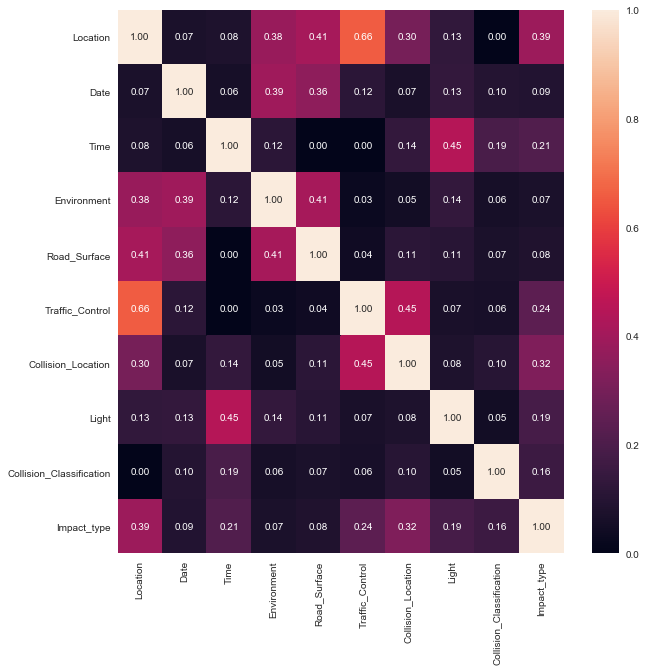

In [17]:
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from dython.nominal import associations

categorical = df.drop(['X', 'Y'], axis=1 )
categorical.head()
associations(categorical, nominal_columns='all', figsize=(10,10))

The most correlated features are *Location* and *Traffic control*. Below shows the collision map with colored data for traffic control. We get almost the complete map if we only activate the *No COntrol* case.  

In [134]:
import plotly.express as px

fig = px.scatter(dfxy, x="X", y="Y", color="Traffic_Control",
                 hover_data=['Location'])

fig.show()

Almost 50% of collisions are due to No Control in traffic. 

In [164]:
import plotly.graph_objects as go

fig = go.Figure(go.Pie(
    values = df.Traffic_Control.value_counts().tolist(),
    labels = df.Traffic_Control.value_counts().index,
    texttemplate = "%{label}: %{value} <br>(%{percent})",
    textposition = "inside"))

fig.show()

# <a id='q5'>7. Question 5 </a>


### <a id='dwtd'>7.1 Do you trust the dataset, or not? Support your answer.  </a>
 

The source for the dataset is reliable, though we didn't check that all the entires in our dataset match with the source dataset. However, a quick comparison of the collision map we created with our data with the [source map](https://open.ottawa.ca/datasets/2016-tabular-transportation-collision-data?geometry=-76.189%2C45.212%2C-75.321%2C45.381) shows that they are compatible. The only entry that is misleading is the midnight for column *Time* which was mentioned in the previous section; (00:00) in that column does not always count for the midnight but also for unknown time. 

### <a id='tie'>7.2 Flag potential invalid entries, anomalous observations, or outliers. How should these entries be treated? </a>

We mentioned potential outliers in each column when we did the univariate/bivariate analysis. The only outlier that was problematic and we had to remove, was the one with x coordinate far larger than all other entries. Although it is a valid entry for the city of Ottawa, i.e. the location exists, it is way far east. 

# <a id='q6'>8. Question 6 </a>

### <a id='sosvt'>8.1 Does any of your analysis suggest that some of the variables should be transformed </a>

* X and Y coordinates were originally in string format and we converted them to float to proceed some of our analysis. 
* Time was originally in string format. We transformed Time to include only hours and converted it to integer, stored in *hours*.
* Date was originally in string format. We transformed Date to include only months and converted it to integer, stored in *months*.